In [2]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import tabulate as tab
import numpy as np
import json
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder, LabelEncoder, PolynomialFeatures
import datetime
from datetime import timedelta
import random
from PIL import Image

# **1. Reality Data Collection**

## **1.1 Request response**

### **1.1.1 Response 200**

In [94]:
url = 'https://www.apple.com/'
requests.get(url)

<Response [200]>

###**1.1.2 Response 400**

In [95]:
url = 'https://www.apple.com/iphone-16/'
requests.get(url)

<Response [404]>

###**1.1.3 Response 5XX**

In [96]:
url = 'https://httpstat.us/500'
requests.get(url)

<Response [500]>

##**1.2 HTML Tag Name**

### **1.2.1 All Tag name and its purpose**

* **html**: Defines the document as an HTML file.
* **head**: Contains meta-information about the document.
* **title**: Sets the page's title.
* **body**: Contains the content visible to users.
* **h1 to h6**: Define headings, h1 is the most important.
* **p**: Defines a paragraph.
* **a**: Creates hyperlinks.
* **img**: Embeds images.
* **div**: Defines a section/block in the document.
* **span**: Defines an inline section of text.
* **strong/em**: Adds emphasis (bold/italic).
* **br**: Adds a line break.
* **ul, ol, li**: Create unordered/ordered lists.
* **table, tr, td**: Create tables, rows, and data cells.
* **meta**: Provides metadata (character set, description).
* **link**: Links external resources.
* **form**: Creates a form for user input.
* **input**: Defines input controls within a form.
* **button**: Defines a clickable button.
* **iframe**: Embeds another HTML document inside the current one.

Simplilearn. (n.d.). HTML tags: Basics and best practices. Simplilearn. Retrieved September 4, 2024, from https://www.simplilearn.com/tutorials/html-tutorial/html-tags

### **1.2.2 Inspect a document**

**Head**

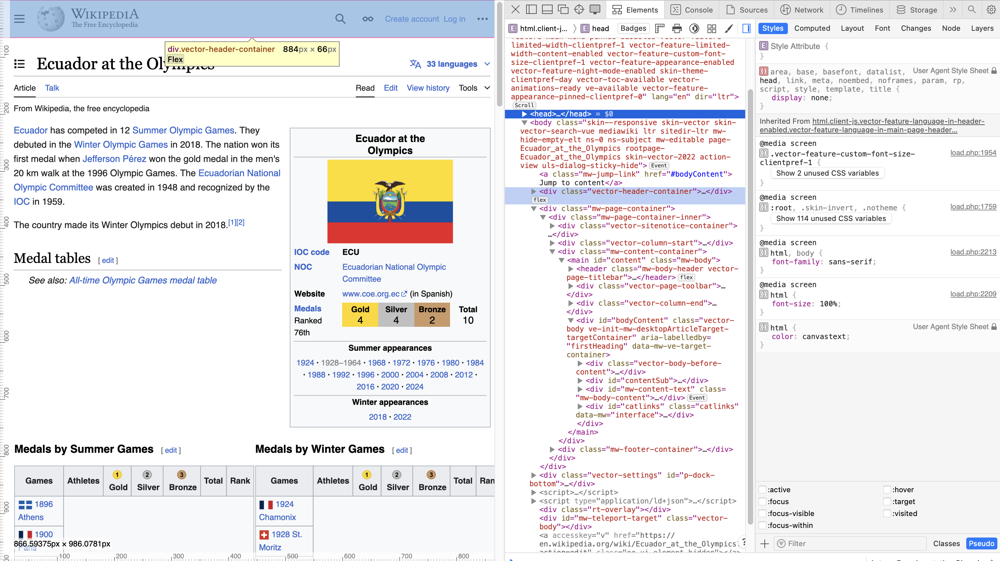

In [97]:
head = Image.open(r'Head.png')
display(head)

**Body**

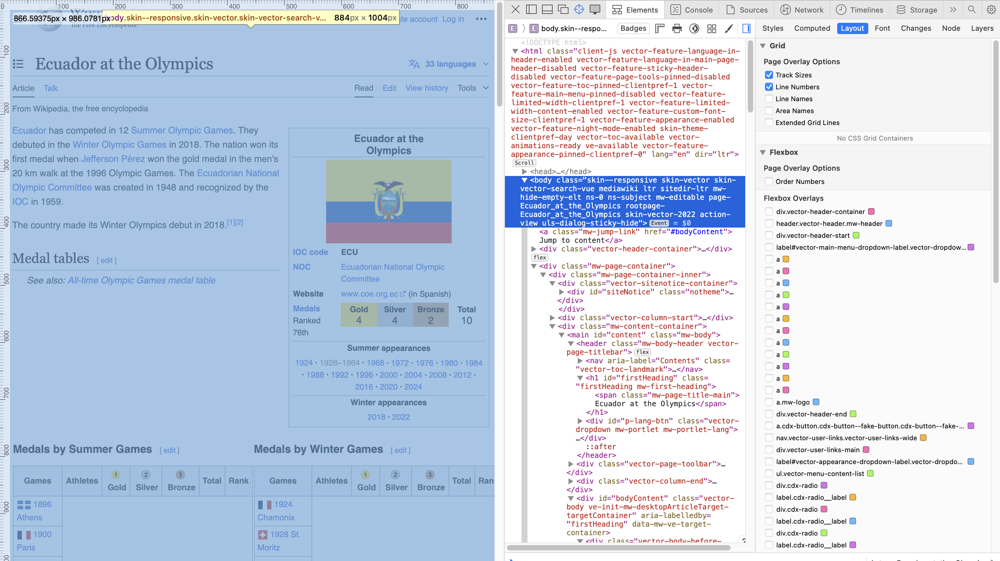

In [98]:
body = Image.open(r'Body.png')
display(body)

**Title**

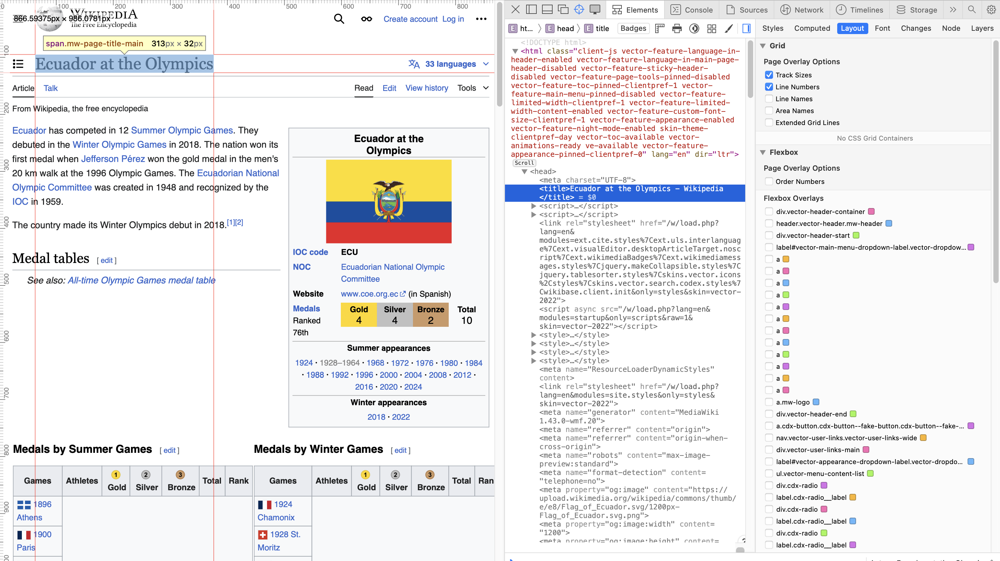

In [99]:
title = Image.open(r'Title.png')
display(title)

**Div**

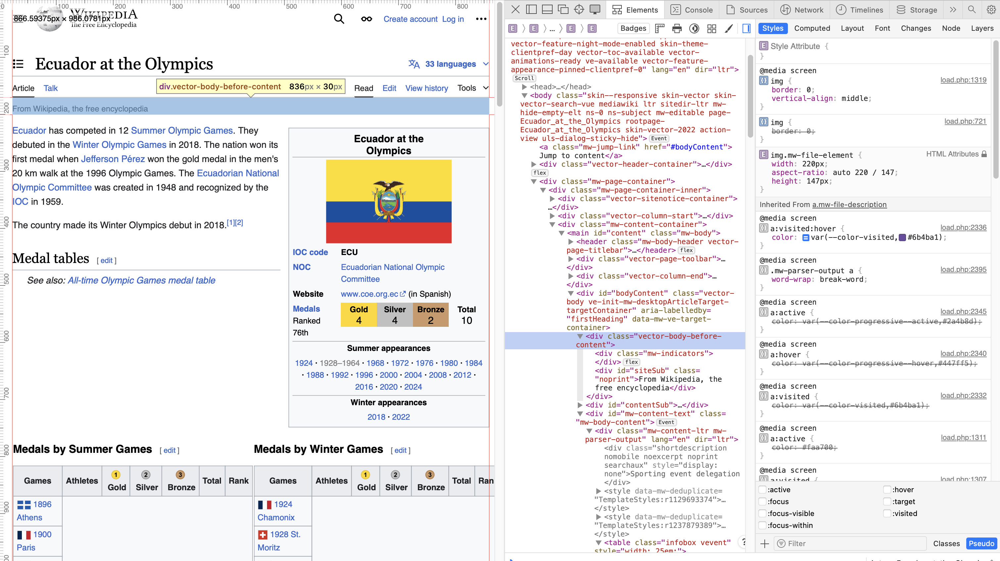

In [100]:
div = Image.open(r'Div.png')
display(div)

**Table**

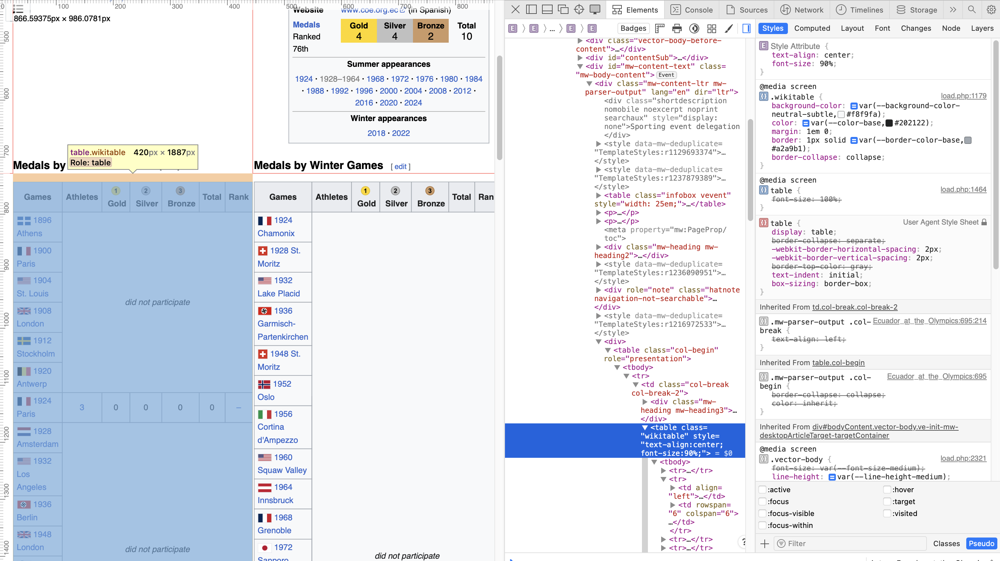

In [101]:
table = Image.open(r'Table.png')
display(table)

**Paragraph**

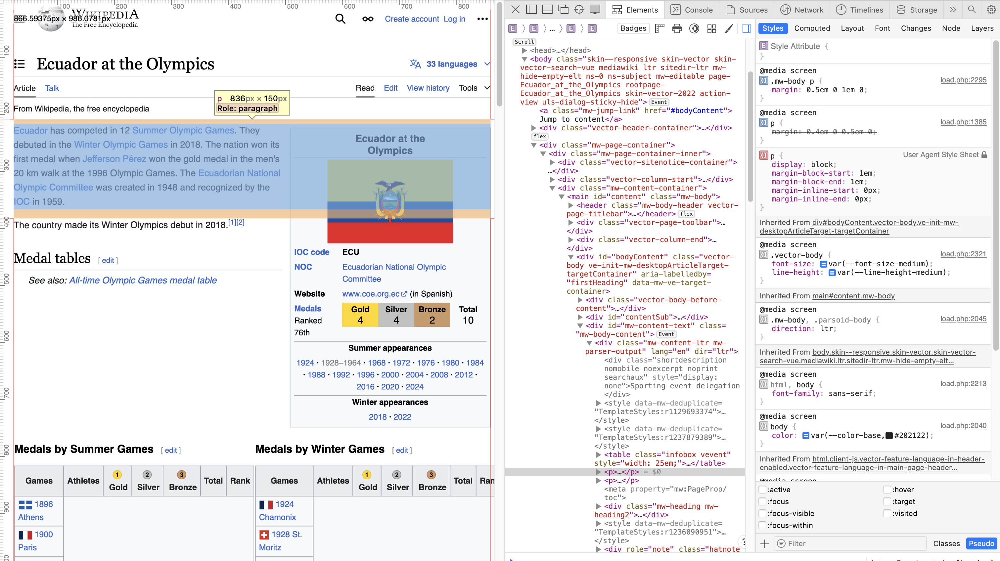

In [102]:
paragraph = Image.open(r'Paragraph.png')
display(paragraph)

**Image**

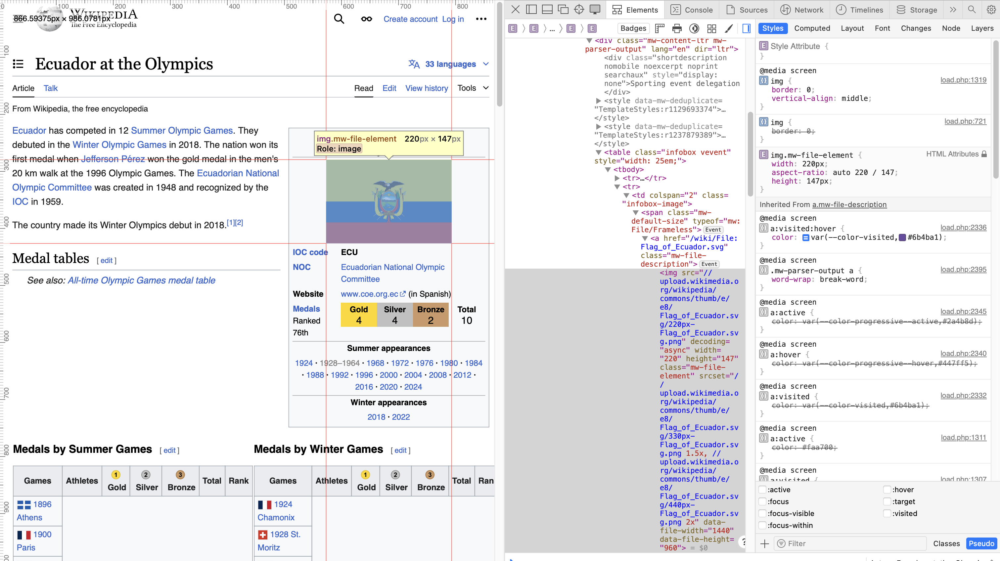

In [103]:
image = Image.open(r'Image.png')
display(image)

#**2. Processing Data**

## **2.1 Scrape using Nested List**

In [104]:
url = 'https://en.wikipedia.org/wiki/Ecuadorian_Serie_A'
requests.get(url)
response = requests.get(url)
raw_html_code = response.text
serie_a = BeautifulSoup (raw_html_code, 'html.parser')

In [105]:
list(serie_a.children)

['html',
 '\n',
 <html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-available" dir="ltr" lang="en">
 <head>
 <meta charset="utf-8"/>
 <title>Ecuadorian Serie A - Wikipedia</title>
 <script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-

In [106]:
[type(item) for item in list(serie_a.children)]

[bs4.element.Doctype, bs4.element.NavigableString, bs4.element.Tag]

In [107]:
head = list(serie_a.children)[2]
head

<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-available" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>Ecuadorian Serie A - Wikipedia</title>
<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width

In [108]:
[type(item) for item in list(head.children)]

[bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString]

In [109]:
body = list(head.children)[3]
body

<body class="skin--responsive skin-vector skin-vector-search-vue mediawiki ltr sitedir-ltr mw-hide-empty-elt ns-0 ns-subject mw-editable page-Ecuadorian_Serie_A rootpage-Ecuadorian_Serie_A skin-vector-2022 action-view"><a class="mw-jump-link" href="#bodyContent">Jump to content</a>
<div class="vector-header-container">
<header class="vector-header mw-header">
<div class="vector-header-start">
<nav aria-label="Site" class="vector-main-menu-landmark">
<div class="vector-dropdown vector-main-menu-dropdown vector-button-flush-left vector-button-flush-right" id="vector-main-menu-dropdown">
<input aria-haspopup="true" aria-label="Main menu" class="vector-dropdown-checkbox" data-event-name="ui.dropdown-vector-main-menu-dropdown" id="vector-main-menu-dropdown-checkbox" role="button" type="checkbox"/>
<label aria-hidden="true" class="vector-dropdown-label cdx-button cdx-button--fake-button cdx-button--fake-button--enabled cdx-button--weight-quiet cdx-button--icon-only" for="vector-main-menu-dro

In [110]:
[type(item) for item in list(body.children)]

[bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString]

In [111]:
div = list(body.children)[4]
div

<div class="mw-page-container">
<div class="mw-page-container-inner">
<div class="vector-sitenotice-container">
<div class="notheme" id="siteNotice"><!-- CentralNotice --></div>
</div>
<div class="vector-column-start">
<div class="vector-main-menu-container">
<div id="mw-navigation">
<nav aria-label="Site" class="vector-main-menu-landmark" id="mw-panel">
<div class="vector-pinned-container" id="vector-main-menu-pinned-container">
</div>
</nav>
</div>
</div>
<div class="vector-sticky-pinned-container">
<nav aria-label="Contents" class="mw-table-of-contents-container vector-toc-landmark" data-event-name="ui.sidebar-toc" id="mw-panel-toc">
<div class="vector-pinned-container" id="vector-toc-pinned-container">
<div class="vector-toc vector-pinnable-element" id="vector-toc">
<div class="vector-pinnable-header vector-toc-pinnable-header vector-pinnable-header-pinned" data-feature-name="toc-pinned" data-pinnable-element-id="vector-toc">
<h2 class="vector-pinnable-header-label">Contents</h2>
<

In [112]:
[type(item) for item in list(div.children)]

[bs4.element.NavigableString, bs4.element.Tag, bs4.element.NavigableString]

In [113]:
pgh = list(div.children)[1]
pgh

<div class="mw-page-container-inner">
<div class="vector-sitenotice-container">
<div class="notheme" id="siteNotice"><!-- CentralNotice --></div>
</div>
<div class="vector-column-start">
<div class="vector-main-menu-container">
<div id="mw-navigation">
<nav aria-label="Site" class="vector-main-menu-landmark" id="mw-panel">
<div class="vector-pinned-container" id="vector-main-menu-pinned-container">
</div>
</nav>
</div>
</div>
<div class="vector-sticky-pinned-container">
<nav aria-label="Contents" class="mw-table-of-contents-container vector-toc-landmark" data-event-name="ui.sidebar-toc" id="mw-panel-toc">
<div class="vector-pinned-container" id="vector-toc-pinned-container">
<div class="vector-toc vector-pinnable-element" id="vector-toc">
<div class="vector-pinnable-header vector-toc-pinnable-header vector-pinnable-header-pinned" data-feature-name="toc-pinned" data-pinnable-element-id="vector-toc">
<h2 class="vector-pinnable-header-label">Contents</h2>
<button class="vector-pinnable-he

In [114]:
[type(item) for item in list(pgh.children)]

[bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString,
 bs4.element.Tag,
 bs4.element.NavigableString]

In [115]:
info = list(pgh.children)[7]
info

<div class="mw-footer-container">
<footer class="mw-footer" id="footer">
<ul id="footer-info">
<li id="footer-info-lastmod"> This page was last edited on 18 June 2024, at 00:23<span class="anonymous-show"> (UTC)</span>.</li>
<li id="footer-info-copyright">Text is available under the <a href="//en.wikipedia.org/wiki/Wikipedia:Text_of_the_Creative_Commons_Attribution-ShareAlike_4.0_International_License" rel="license">Creative Commons Attribution-ShareAlike License 4.0</a><a href="//en.wikipedia.org/wiki/Wikipedia:Text_of_the_Creative_Commons_Attribution-ShareAlike_4.0_International_License" rel="license" style="display:none;"></a>;
additional terms may apply. By using this site, you agree to the <a href="//foundation.wikimedia.org/wiki/Special:MyLanguage/Policy:Terms_of_Use">Terms of Use</a> and <a href="//foundation.wikimedia.org/wiki/Special:MyLanguage/Policy:Privacy_policy">Privacy Policy</a>. Wikipedia® is a registered trademark of the <a href="//wikimediafoundation.org/">Wikimedia 

In [116]:
print("\n",info.get_text())


 


 This page was last edited on 18 June 2024, at 00:23 (UTC).
Text is available under the Creative Commons Attribution-ShareAlike License 4.0;
additional terms may apply. By using this site, you agree to the Terms of Use and Privacy Policy. Wikipedia® is a registered trademark of the Wikimedia Foundation, Inc., a non-profit organization.


Privacy policy
About Wikipedia
Disclaimers
Contact Wikipedia
Code of Conduct
Developers
Statistics
Cookie statement
Mobile view









##**2.2 Scrape**

###**2.2.1 Name Tag**

In [117]:
print(serie_a.title.string)

Ecuadorian Serie A - Wikipedia


In [118]:
print(serie_a.h1)
print("\n",serie_a.h1.string)

<h1 class="firstHeading mw-first-heading" id="firstHeading"><span class="mw-page-title-main">Ecuadorian Serie A</span></h1>

 Ecuadorian Serie A


In [119]:
element_found = serie_a.find_all('h2')
element_found

[<h2 class="vector-pinnable-header-label">Contents</h2>,
 <h2 id="Format">Format</h2>,
 <h2 id="History">History</h2>,
 <h2 id="Clubs">Clubs</h2>,
 <h2 id="Champions_by_year">Champions by year</h2>,
 <h2 id="Titles_by_club">Titles by club</h2>,
 <h2 id="All-time_top_goalscorers">All-time top goalscorers</h2>,
 <h2 id="See_also">See also</h2>,
 <h2 id="References">References</h2>,
 <h2 id="External_links">External links</h2>]

###**2.2.2 Class Tag**

In [120]:
element_found = serie_a.find(class_='vector-pinnable-header-label').get_text()
element_found

'Main menu'

###**2.2.3 Id Tag**

In [121]:
element_found = serie_a.find(id='Champions_by_year').get_text()
element_found

'Champions by year'

##**2.3 Create a Data Frame**

In [122]:
table_found = serie_a.find_all('table')
print (f'Total tables: {len(table_found)}')
champions = pd.read_html(str(table_found))[2]
champions.rename(columns={
    'Ed.': 'Edition',
    'Champion (Title count)': 'Champion',
    'Leading goalscorer(s)[2]': 'Leading goalscorer(s)',
}, inplace=True)
champions.set_index('Edition', inplace=True)
champions = champions.loc[:, ['Season', 'Champion', 'Runner-up', 'Third place', 'Leading goalscorer(s)']]

Total tables: 12


<ipython-input-122-1c1ba3afd7de>:3: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  champions = pd.read_html(str(table_found))[2]


In [123]:
champions['Champion'] = champions['Champion'].str.extract(r'(^[\w\s]+)')
champions['Leading goalscorer'] = champions['Leading goalscorer(s)'].str.extract(r'^([^\(]+)')
champions['Goals'] = champions['Leading goalscorer(s)'].str.extract(r'(\d+)')
champions.dropna(inplace=True)

In [124]:
champions = champions.loc[:, ['Season', 'Champion', 'Runner-up', 'Third place', 'Leading goalscorer', 'Goals']]
champions['Goals'] = champions['Goals'].astype('int')
champions['Season'] = champions['Season'].astype('int')
champions

,Season,Champion,Runner-up,Third place,Leading goalscorer,Goals
Edition,,,,,,
1,1957,Emelec,Barcelona,Deportivo Quito,Simón Cañarte,4
2,1960,Barcelona,Emelec,Patria,Enrique Cantos,8
3,1961,Emelec,Patria,Everest,Galo Pinto,12
4,1962,Everest,Barcelona,Emelec,Iris López,9
5,1963,Barcelona,Emelec,Deportivo Quito,Carlos Alberto Raffo,4
...,...,...,...,...,...,...
62,2019,Delfín,LDU Quito,Macará,Luis Amarilla,19
63,2020,Barcelona,LDU Quito,Independiente del Valle,Cristian Martínez Borja,24
64,2021,Independiente del Valle,Emelec,Universidad Católica,Jonathan Bauman,26


#**3. Feature Engineering**

##**3.1 Date and time methods**

In [125]:
champions['Season'] = pd.to_datetime(champions['Season'], format='%Y')
champions['Season'] = champions['Season'].dt.year

##**3.2 Mathematical computations**

### **3.2.1 Sum**

In [126]:
total_goals = champions['Goals'].sum()
total_goals

1443

###**3.2.2 Mean**

In [127]:
mean = champions['Goals'].mean()
mean

21.863636363636363

###**3.2.3 Standar deviation**

In [128]:
std = champions['Goals'].std()
std

7.191632667175126

###**3.2.4 MAX**

In [129]:
min = champions['Goals'].max()
min

43

###**3.2.5 MIN**

In [130]:
min = champions['Goals'].min()
min

4

##**3.3 Common operations**

In [131]:
filtered_30 = champions[champions['Goals'] > 30]
filtered_30

,Season,Champion,Runner-up,Third place,Leading goalscorer,Goals
Edition,,,,,,
17,1975,LDU Quito,Deportivo Cuenca,Aucas,Ángel Liciardi,36
32,1990,LDU Quito,Barcelona,Emelec,Ermen Benítez,33
40,1998,LDU Quito,Emelec,Aucas,Iván Kaviedes,43
61,2018,LDU Quito,Emelec,Barcelona,Jhon Cifuente,37


##**3.4 Encoding categorical variables**

###**3.4.1 Ordinal Encoder**

In [132]:
champions['Champion'].unique()

array(['Emelec ', 'Barcelona ', 'Everest ', 'Deportivo Quito ',
       'El Nacional ', 'LDU Quito ', 'Olmedo ', 'Deportivo Cuenca ',
       'Delfín ', 'Independiente del Valle ', 'Aucas '], dtype=object)

In [133]:
label_encoder = LabelEncoder()
champions['Team_Id'] = label_encoder. fit_transform(champions ['Champion'])

In [134]:
champions

,Season,Champion,Runner-up,Third place,Leading goalscorer,Goals,Team_Id
Edition,,,,,,,
1,1957,Emelec,Barcelona,Deportivo Quito,Simón Cañarte,4,6
2,1960,Barcelona,Emelec,Patria,Enrique Cantos,8,1
3,1961,Emelec,Patria,Everest,Galo Pinto,12,6
4,1962,Everest,Barcelona,Emelec,Iris López,9,7
5,1963,Barcelona,Emelec,Deportivo Quito,Carlos Alberto Raffo,4,1
...,...,...,...,...,...,...,...
62,2019,Delfín,LDU Quito,Macará,Luis Amarilla,19,2
63,2020,Barcelona,LDU Quito,Independiente del Valle,Cristian Martínez Borja,24,1
64,2021,Independiente del Valle,Emelec,Universidad Católica,Jonathan Bauman,26,8


###**3.4.2 One-Hot Encoder**

In [135]:
champions_oh = pd.get_dummies(champions, columns = ['Third place'], prefix = 'Team', dtype=int)
champions_oh

,Season,Champion,Runner-up,Leading goalscorer,Goals,Team_Id,Team_América de Quito,Team_Aucas,Team_Audaz Octubrino,Team_Barcelona,...,Team_Independiente del Valle,Team_LDU Portoviejo,Team_LDU Quito,Team_Macará,Team_Manta Sport,Team_Olmedo,Team_Patria,Team_Politécnico,Team_Técnico Universitario,Team_Universidad Católica
Edition,,,,,,,,,,,,,,,,,,,,,
1,1957,Emelec,Barcelona,Simón Cañarte,4,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1960,Barcelona,Emelec,Enrique Cantos,8,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,1961,Emelec,Patria,Galo Pinto,12,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1962,Everest,Barcelona,Iris López,9,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1963,Barcelona,Emelec,Carlos Alberto Raffo,4,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,2019,Delfín,LDU Quito,Luis Amarilla,19,2,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
63,2020,Barcelona,LDU Quito,Cristian Martínez Borja,24,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
64,2021,Independiente del Valle,Emelec,Jonathan Bauman,26,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


###**3.4.3 K-1 Variables**

In [136]:
championsk_1 = pd.get_dummies(champions, columns = ['Runner-up'], prefix = 'Team', drop_first = True, dtype=int)
championsk_1

,Season,Champion,Third place,Leading goalscorer,Goals,Team_Id,Team_América de Quito,Team_Barcelona,Team_Delfín,Team_Deportivo Cuenca,...,Team_El Nacional,Team_Emelec,Team_Filanbanco,Team_Independiente del Valle,Team_LDU Quito,Team_Olmedo,Team_Patria,Team_Técnico Universitario,Team_Universidad Católica,Team_Valdez
Edition,,,,,,,,,,,,,,,,,,,,,
1,1957,Emelec,Deportivo Quito,Simón Cañarte,4,6,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1960,Barcelona,Patria,Enrique Cantos,8,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,1961,Emelec,Everest,Galo Pinto,12,6,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,1962,Everest,Emelec,Iris López,9,7,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1963,Barcelona,Deportivo Quito,Carlos Alberto Raffo,4,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,2019,Delfín,Macará,Luis Amarilla,19,2,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
63,2020,Barcelona,Independiente del Valle,Cristian Martínez Borja,24,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
64,2021,Independiente del Valle,Universidad Católica,Jonathan Bauman,26,8,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
